<a href="https://colab.research.google.com/github/eternitvy/PCVK_26/blob/main/Jobsheet3/Week03_Tugas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [8]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import glob
import os
from google.colab.patches import cv2_imshow

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


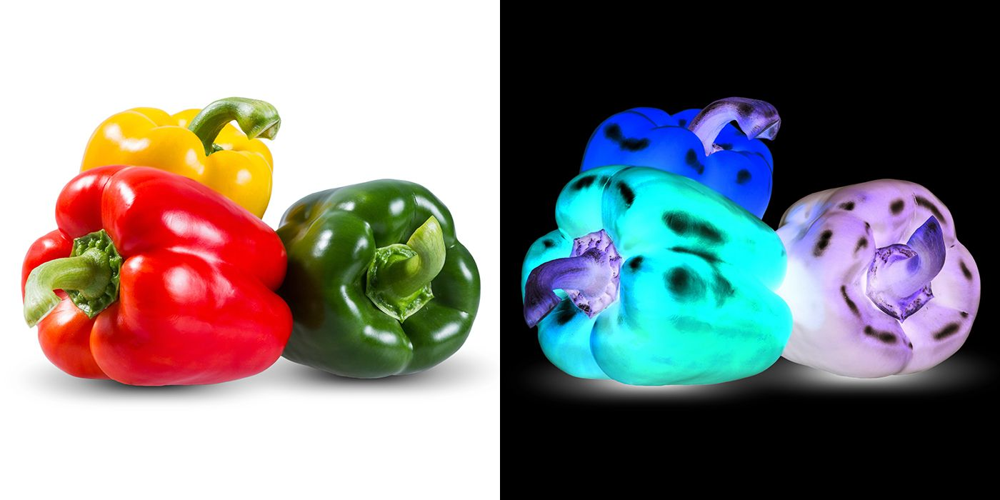

In [9]:
# Soal 1 - Inverse Citra
def inverse_image(img_path):
    img = cv.imread(img_path)
    if img is None:
        print("Gambar tidak ditemukan!")
        return

    # Proses Inverse
    inv_img = 255 - img

    final_frame = cv.hconcat((img, inv_img))
    cv2_imshow(final_frame)

inverse_image('/content/drive/MyDrive/AAPCVK/Paprika.jpg')

Masukkan tingkat kecerahan: 10
Masukkan kontras: 1.5


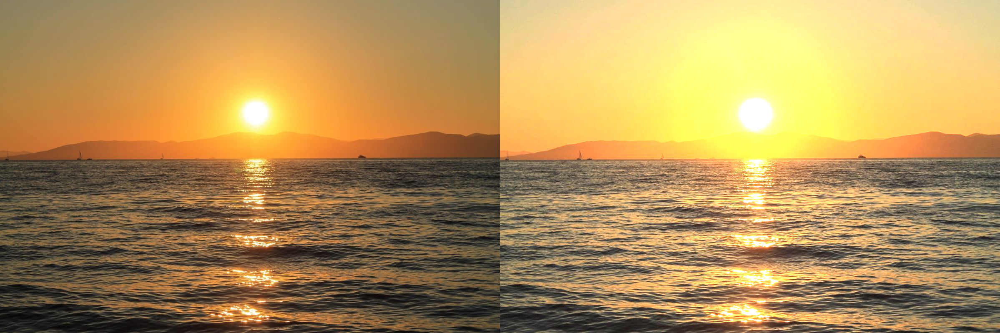

In [10]:
# Soal 2 - Transformasi Contrast
def contrast_brightness(img_path):
    img = cv.imread(img_path)
    if img is None: return

    try:
        brightness = int(input('Masukkan tingkat kecerahan: '))
        contrast = float(input('Masukkan kontras: '))
    except ValueError:
        print('Error, masukkan angka yang valid')
        return

    alpha = contrast
    beta = brightness

    # Menggunakan cv.convertScaleAbs untuk operasi linear g(x) = alpha*f(x) + beta
    res = cv.convertScaleAbs(img, alpha=alpha, beta=beta)

    cv2_imshow(cv.hconcat((img, res)))

contrast_brightness('/content/drive/MyDrive/AAPCVK/sunset.jpg')

Masukkan nilai kecerahan: 50


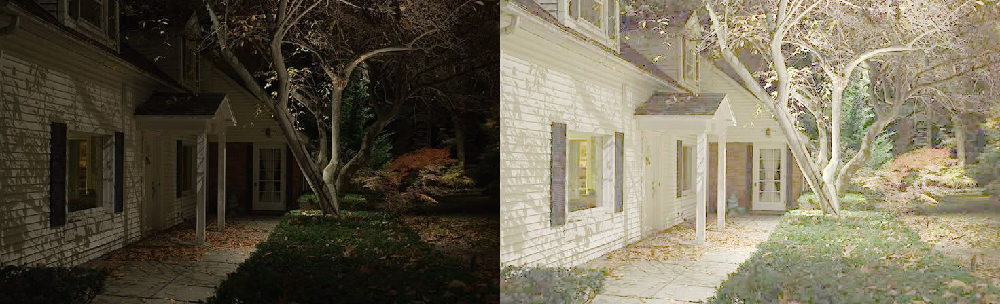

In [11]:
# Soal 3 - Transformasi Logarithmic Brightness
def log_brightness(img_path):
    img = cv.imread(img_path)
    if img is None: return

    c = float(input('Masukkan nilai kecerahan: '))

    # mengonversi ke float
    img_float = img.astype(np.float32)

    # menerapkan rumus s = c * log(1 + r)
    log_trans = c * np.log1p(img_float)

    # menf-clip dan mengonversi kembali ke uint8
    log_trans = np.clip(log_trans, 0, 255).astype(np.uint8)

    cv2_imshow(cv.hconcat((img, log_trans)))

log_brightness('/content/drive/MyDrive/AAPCVK/house.jpg')

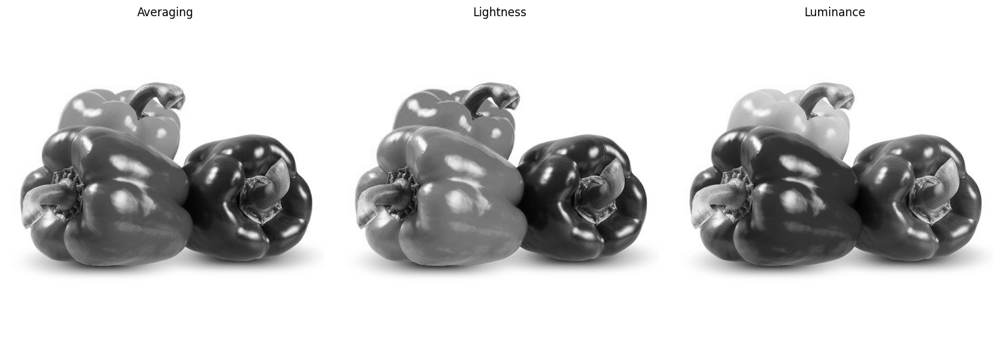

In [12]:
# Soal 4 - Transformasi Grayscale
def grayscale_comparison(img_path):
    img = cv.imread(img_path)
    if img is None: return

    # mengonversi BGR ke RGB dan ubah tipe data ke float32
    img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB).astype(np.float32)

    # memisahkan channel R, G, B
    R = img_rgb[:, :, 0]
    G = img_rgb[:, :, 1]
    B = img_rgb[:, :, 2]

    # Averaging: (R + G + B) / 3
    gray_avg = ((R + G + B) / 3.0)
    gray_avg = np.clip(gray_avg, 0, 255).astype(np.uint8)

    # Lightness: (max(R,G,B) + min(R,G,B)) / 2
    max_val = np.maximum(np.maximum(R, G), B)
    min_val = np.minimum(np.minimum(R, G), B)
    gray_light = ((max_val + min_val) / 2.0)
    gray_light = np.clip(gray_light, 0, 255).astype(np.uint8)

    # Luminance: 0.21*R + 0.72*G + 0.07*B
    gray_lum = (0.21 * R + 0.72 * G + 0.07 * B)
    gray_lum = np.clip(gray_lum, 0, 255).astype(np.uint8)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(gray_avg, cmap='gray')
    axes[0].set_title('Averaging')
    axes[0].axis('off')

    axes[1].imshow(gray_light, cmap='gray')
    axes[1].set_title('Lightness')
    axes[1].axis('off')

    axes[2].imshow(gray_lum, cmap='gray')
    axes[2].set_title('Luminance')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

grayscale_comparison('/content/drive/MyDrive/AAPCVK/Paprika.jpg')

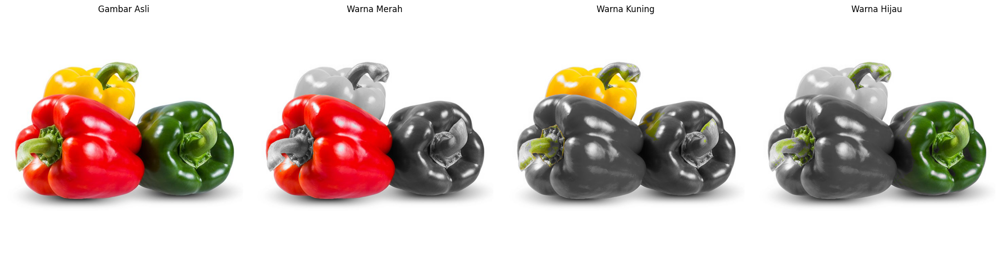

In [13]:
# Soal 5 - Menampilkan warna tertentu dan warna lain menjadi grayscale
def selective_grayscale_all(img_path):
  img = cv.imread(img_path)
  if img is None: return

  # mengonversi BGR ke HSV dan buat versi graysaclenya
  hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
  gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
  gray_bgr = cv.cvtColor(gray, cv.COLOR_GRAY2BGR)

  # menampilkan warna merah
  lower_red1 = np.array([0, 50, 50])
  upper_red1 = np.array([10,255,255])
  lower_red2 = np.array([170, 50, 50])
  upper_red2 = np.array([180, 255, 255])

  mask_red1 = cv.inRange(hsv, lower_red1, upper_red1)
  mask_red2 = cv.inRange(hsv, lower_red2, upper_red2)
  mask_red = cv.bitwise_or(mask_red1, mask_red2)

  res_red = np.where(mask_red[:,:,None] == 255, img, gray_bgr)

  # menampilkan warna kuning
  lower_yellow = np.array([15,80,80])
  upper_yellow = np.array([35, 255, 255])
  mask_yellow = cv.inRange(hsv, lower_yellow, upper_yellow)

  res_yellow = np.where(mask_yellow[:,:, None] == 255, img, gray_bgr)

  # menampilkan warna hijau
  lower_green = np.array([35, 50, 50])
  upper_green = np.array([85, 255, 255])
  mask_green = cv.inRange(hsv, lower_green, upper_green)

  res_green = np.where(mask_green[:, :, None] == 255, img, gray_bgr)

  # mengonversi dari BGR ke RGB untuk Matplotlib
  img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
  res_red_rgb = cv.cvtColor(res_red, cv.COLOR_BGR2RGB)
  res_yellow_rgb = cv.cvtColor(res_yellow, cv.COLOR_BGR2RGB)
  res_green_rgb = cv.cvtColor(res_green, cv.COLOR_BGR2RGB)

  rig, axes = plt.subplots(1, 4, figsize=(20, 5))

  axes[0].imshow(img_rgb)
  axes[0].set_title('Gambar Asli')
  axes[0].axis('off')

  axes[1].imshow(res_red_rgb)
  axes[1].set_title('Warna Merah')
  axes[1].axis('off')

  axes[2].imshow(res_yellow_rgb)
  axes[2].set_title('Warna Kuning')
  axes[2].axis('off')

  axes[3].imshow(res_green_rgb)
  axes[3].set_title('Warna Hijau')
  axes[3].axis('off')

  plt.tight_layout()
  plt.show()

selective_grayscale_all('/content/drive/MyDrive/AAPCVK/Paprika.jpg')

 Gamma correction pada Citra 
-----------------------------
Masukkan nilai gamma: 0.5


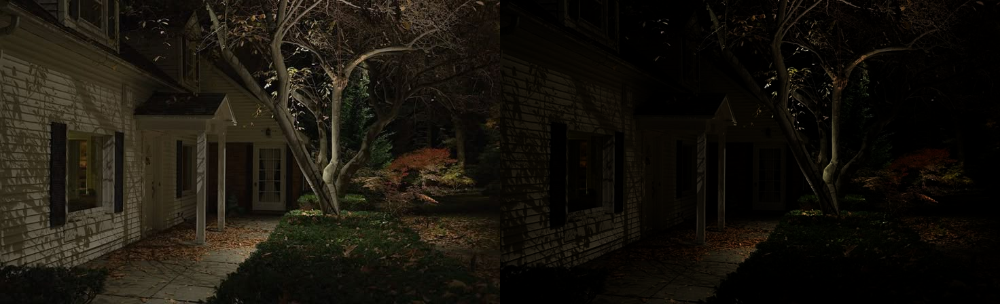

In [14]:
# Soal 6 - Gamma Correction
print(' Gamma correction pada Citra ')
print('-----------------------------')

def gamma_correction(img_path):
    img = cv.imread(img_path)
    if img is None: return

    try:
        gamma = float(input('Masukkan nilai gamma: '))
    except ValueError:
        print('Error, not a number')
        return

    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")

    gamma_img = cv.LUT(img, table)
    cv2_imshow(cv.hconcat((img, gamma_img)))

# Panggil fungsi
gamma_correction('/content/drive/MyDrive/AAPCVK/house.jpg')

Masukkan bit depth tujuan (1-8): 3
Bit depth awal  : 8 bit
Bit depth tujuan: 3 bit
Jumlah level    : 8


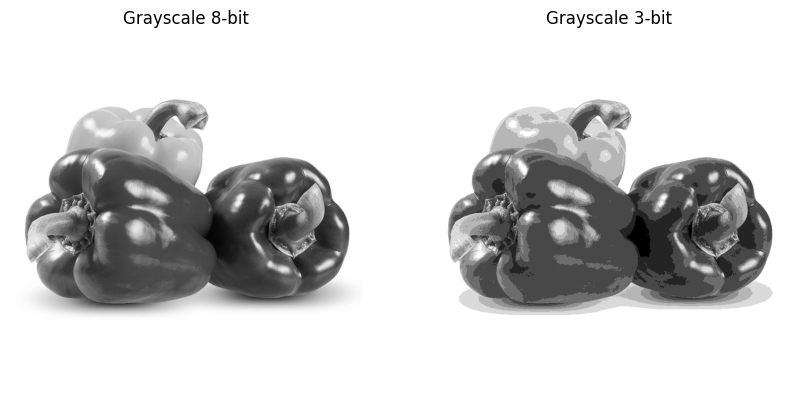

In [15]:
# Soal 7 - Image Depth
def image_depth_simulation(img_path):
    img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
    if img is None: return

    try:
        bit_depth = int(input('Masukkan bit depth tujuan (1-8): '))
    except ValueError:
        print('Error, not a number')
        return

    levels = 2 ** bit_depth
    level_size = 255.0 / (levels - 1)

    # Kuantisasi warna
    depth_image = np.round(img / level_size) * level_size
    depth_image = np.clip(depth_image, 0, 255).astype(np.uint8)

    print(f"Bit depth awal  : 8 bit")
    print(f"Bit depth tujuan: {bit_depth} bit")
    print(f"Jumlah level    : {levels}")

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(img, cmap='gray'); axes[0].set_title('Grayscale 8-bit')
    axes[1].imshow(depth_image, cmap='gray'); axes[1].set_title(f'Grayscale {bit_depth}-bit')
    for ax in axes: ax.axis('off')
    plt.show()

image_depth_simulation('/content/drive/MyDrive/AAPCVK/Paprika.jpg')

Mengekstrak berkas ZIP...
Ekstraksi selesai!

=== HASIL EVALUASI AVERAGE DENOISING & PSNR ===
Jumlah Citra (N):  10 | Nilai PSNR: 19.74 dB
Jumlah Citra (N):  20 | Nilai PSNR: 19.84 dB
Jumlah Citra (N):  40 | Nilai PSNR: 19.89 dB
Jumlah Citra (N):  80 | Nilai PSNR: 19.92 dB
Jumlah Citra (N): 100 | Nilai PSNR: 19.92 dB


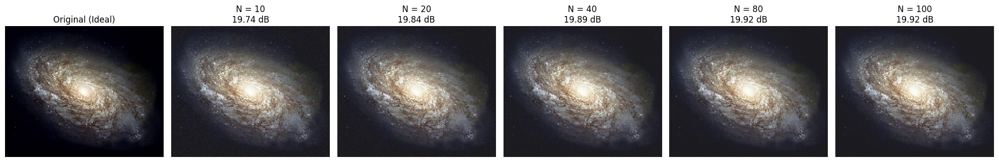

In [16]:
# Soal 8
import glob
import zipfile
import os

def calculate_psnr(img1, img2):
    # menghitung MSE
    mse = np.mean((img1.astype(np.float64) - img2.astype(np.float64)) ** 2)
    if mse == 0:
        return 100.0
    max_pixel = 255.0
    # menghitung nilai PSNR dalam dB
    return 20 * np.log10(max_pixel / np.sqrt(mse))

def run_average_denoising_zip(zip_path, original_img_path):
    extract_folder = './noises_extracted'
    if not os.path.exists(extract_folder):
        print("Mengekstrak berkas ZIP...")
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(extract_folder)
        print("Ekstraksi selesai!")

    original = cv.imread(original_img_path)
    if original is None:
        print("Gambar asli tidak ditemukan! Cek kembali path galaxy.jpg")
        return

    noise_files = sorted(
        glob.glob(os.path.join(extract_folder, '**', '*.jpg'), recursive=True) +
        glob.glob(os.path.join(extract_folder, '**', '*.png'), recursive=True)
    )

    if len(noise_files) == 0:
        print("Tidak ada berkas gambar ditemukan di dalam ZIP!")
        return

    images = [cv.imread(f) for f in noise_files if cv.imread(f) is not None]

    counts = [10, 20, 40, 80, 100]
    results = []

    print("\n=== HASIL EVALUASI AVERAGE DENOISING & PSNR ===")
    for N in counts:
        if len(images) < N:
            print(f"Jumlah sampel gambar noise tidak mencukupi untuk N={N}")
            break

        sub_set = images[:N]

        stack = np.stack(sub_set, axis=0).astype(np.float32)
        avg_img = np.mean(stack, axis=0).astype(np.uint8)

        psnr_val = calculate_psnr(original, avg_img)
        results.append((N, avg_img, psnr_val))
        print(f"Jumlah Citra (N): {N:3d} | Nilai PSNR: {psnr_val:.2f} dB")

    fig, axes = plt.subplots(1, len(results) + 1, figsize=(20, 4))

    axes[0].imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
    axes[0].set_title("Original (Ideal)")
    axes[0].axis('off')

    for i, (N, denoised_img, psnr_val) in enumerate(results):
        axes[i+1].imshow(cv.cvtColor(denoised_img, cv.COLOR_BGR2RGB))
        axes[i+1].set_title(f"N = {N}\n{psnr_val:.2f} dB")
        axes[i+1].axis('off')

    plt.tight_layout()
    plt.show()

run_average_denoising_zip(
    zip_path='/content/drive/MyDrive/AAPCVK/noises.zip',
    original_img_path='/content/drive/MyDrive/AAPCVK/galaxy.jpg'
)

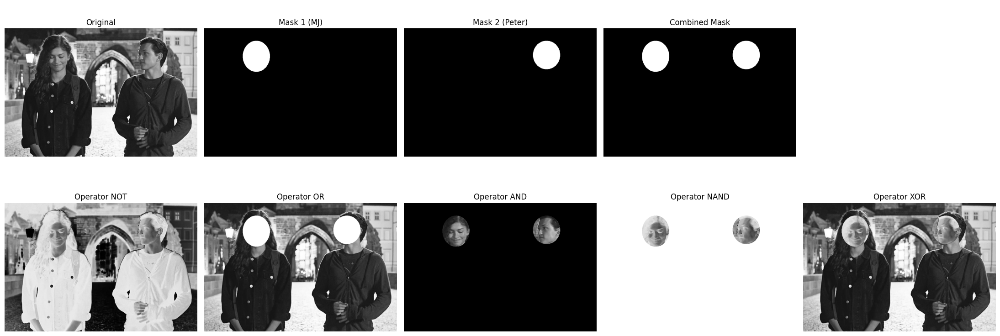

In [17]:
# Soal 9

def dual_face_masking(img_path):
    img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
    if img is None:return

    h, w = img.shape

    # membuat masking pada foto peter dan mj
    mask_mj = np.zeros((h, w), dtype=np.uint8)
    mask_peter = np.zeros((h, w), dtype=np.uint8)


    center_mj = (int(w * 0.27), int(h * 0.22))
    axes_mj = (int(w * 0.07), int(h * 0.12))

    center_peter = (int(w * 0.74), int(h * 0.21))
    axes_peter = (int(w * 0.07), int(h * 0.11))

    cv.ellipse(mask_mj, center_mj, axes_mj, 0, 0, 360, 255, -1)
    cv.ellipse(mask_peter, center_peter, axes_peter, 0, 0, 360, 255, -1)

    combined_mask = cv.bitwise_or(mask_mj, mask_peter)

    # EKSEKUSI OPERASI LOGIKA BITWISE
    ops = {
        'NOT': cv.bitwise_not(img),
        'OR': cv.bitwise_or(img, combined_mask),
        'AND': cv.bitwise_and(img, combined_mask),
        'NAND': cv.bitwise_not(cv.bitwise_and(img, combined_mask)),
        'XOR': cv.bitwise_xor(img, combined_mask)
    }

    fig, axes = plt.subplots(2, 5, figsize=(22, 8))

    axes[0, 0].imshow(img, cmap='gray')
    axes[0, 0].set_title('Original')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(mask_mj, cmap='gray')
    axes[0, 1].set_title('Mask 1 (MJ)')
    axes[0, 1].axis('off')

    axes[0, 2].imshow(mask_peter, cmap='gray')
    axes[0, 2].set_title('Mask 2 (Peter)')
    axes[0, 2].axis('off')

    axes[0, 3].imshow(combined_mask, cmap='gray')
    axes[0, 3].set_title('Combined Mask')
    axes[0, 3].axis('off')

    axes[0, 4].axis('off')

    for i, (name, res) in enumerate(ops.items()):
        axes[1, i].imshow(res, cmap='gray')
        axes[1, i].set_title(f'Operator {name}')
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()

dual_face_masking('/content/drive/MyDrive/AAPCVK/couple.jpg')

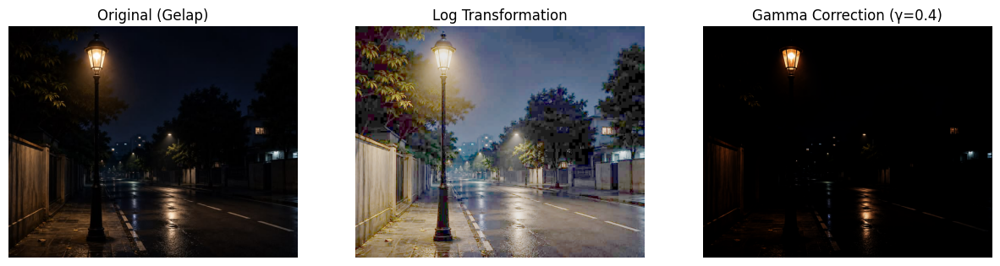

In [18]:
# Soal 10 - Foto Malam Hari
def enhance_night_photo(img_path):
    img = cv.imread(img_path)
    if img is None: return

    # Metode 1: Logarithmic Brightness Transformation
    c = 42
    img_float = img.astype(np.float32)
    log_img = np.clip(c * np.log1p(img_float), 0, 255).astype(np.uint8)

    # Metode 2: Gamma Correction
    gamma = 0.4
    table = np.array([((i / 255.0) ** (1.0 / gamma)) * 255 for i in np.arange(0, 256)]).astype("uint8")
    gamma_img = cv.LUT(img, table)

    # menampilkan perbandingan
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)); axes[0].set_title("Original (Gelap)")
    axes[1].imshow(cv.cvtColor(log_img, cv.COLOR_BGR2RGB)); axes[1].set_title("Log Transformation")
    axes[2].imshow(cv.cvtColor(gamma_img, cv.COLOR_BGR2RGB)); axes[2].set_title("Gamma Correction (γ=0.4)")
    for ax in axes: ax.axis('off')
    plt.show()

enhance_night_photo('/content/drive/MyDrive/AAPCVK/foto_malam.jpg')

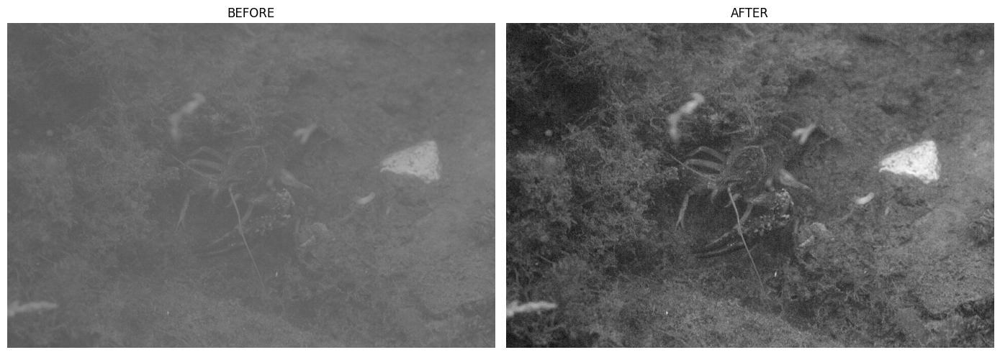

In [21]:
# Soal 11 - crayfish
def enhance_crayfish(img_path):
    img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
    if img is None:
        print("Gambar tidak ditemukan! Cek kembali path filenya.")
        return

    # 2. METODE 1: Log Transformation (Point Processing)
    # Merenggangkan nilai piksel gelap agar detail crayfish terangkat
    c = 255 / np.log(1 + np.max(img))
    log_img = c * (np.log(img.astype(np.float64) + 1))
    log_img = np.array(log_img, dtype=np.uint8)

    # 3. METODE 2: Contrast Stretching / Min-Max Normalization
    # Melebarkan rentang nilai piksel hasil log ke skala penuh 0 - 255
    min_val = np.min(log_img)
    max_val = np.max(log_img)
    final_img = ((log_img - min_val) / (max_val - min_val) * 255).astype(np.uint8)

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    axes[0].imshow(img, cmap='gray', vmin=0, vmax=255)
    axes[0].set_title('BEFORE')
    axes[0].axis('off')

    axes[1].imshow(final_img, cmap='gray', vmin=0, vmax=255)
    axes[1].set_title('AFTER')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

enhance_crayfish('/content/drive/MyDrive/AAPCVK/crayfish.jpg')